# Recognition tables with text
variant 4

In [1]:
name_jpg = 'doc00030020210414100706_001.jpg'

In [2]:
%matplotlib inline
import pytesseract
import cv2
import imutils
import numpy as np
import matplotlib.pyplot as plt
import copy

In [3]:
def show_image (img):
    plt.figure(figsize=(20,20))
    plt.imshow(img)
    plt.show()

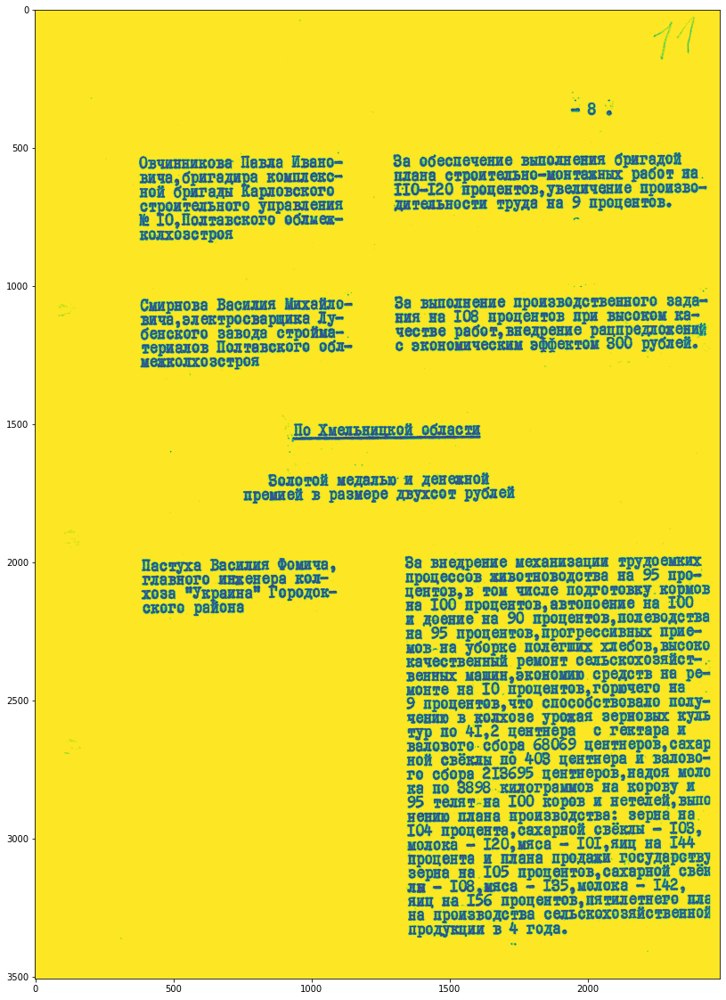

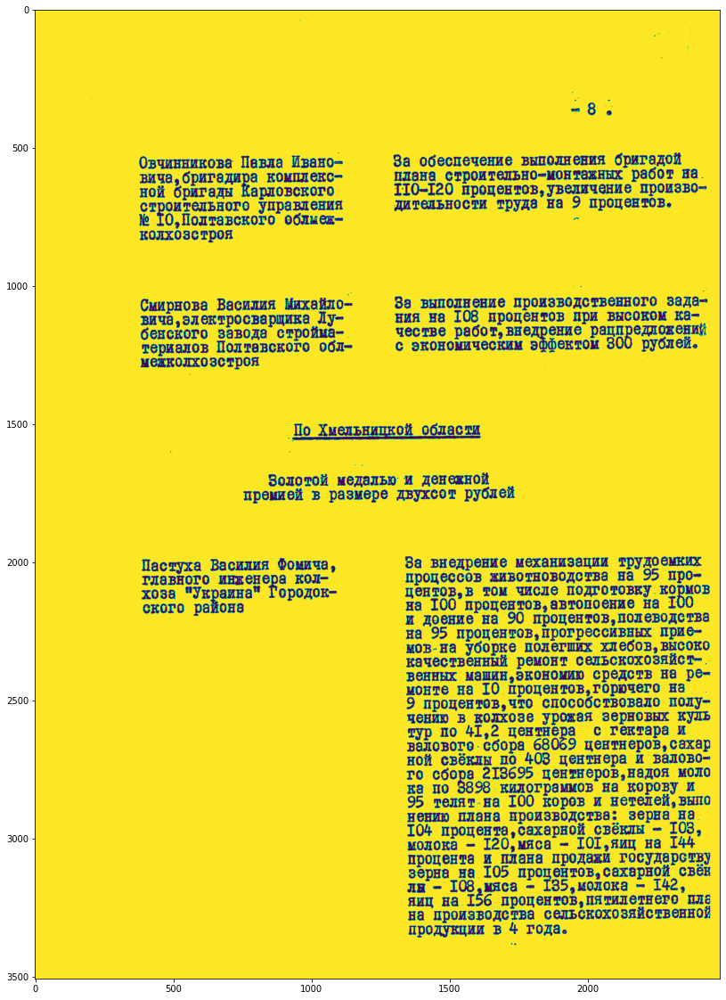

In [4]:
gray = cv2.imread(name_jpg, 0)
show_image(gray)
#gray = cv2.cvtColor(gray, cv2.COLOR_BGR2GRAY)
ret, threshold_gray = cv2.threshold(gray, 120, 255, 0)
show_image(threshold_gray)

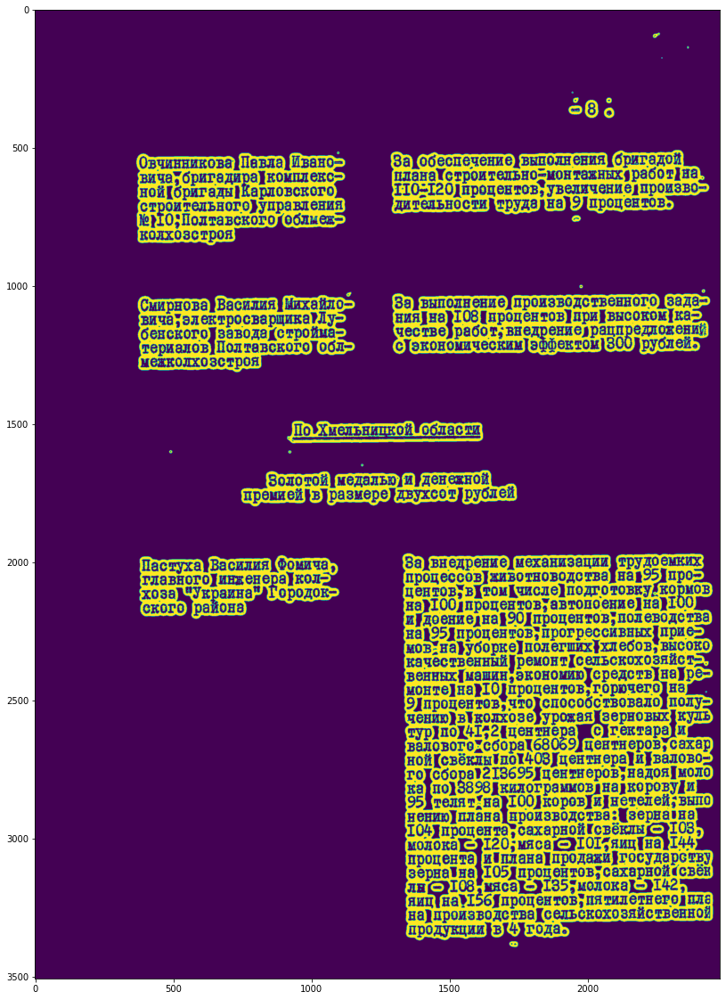

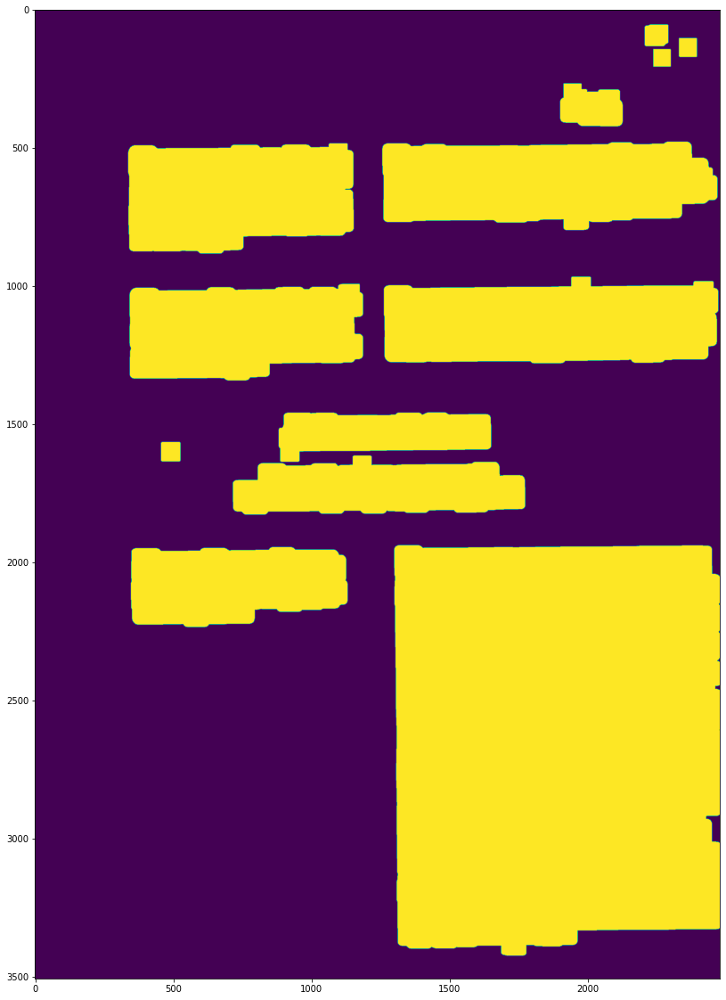

In [5]:
binary = cv2.adaptiveThreshold(threshold_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 35, -5)
# Show pictures 
show_image(binary)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(11,11))
dilation = cv2.dilate(binary,kernel,iterations = 6)
show_image(dilation)

[[348, 1946, 785, 290], [1301, 1939, 1179, 1485], [717, 1615, 1059, 214], [883, 1459, 770, 179], [343, 994, 846, 350], [1264, 968, 1211, 314], [338, 486, 817, 399], [1258, 480, 1214, 320], [1902, 269, 227, 156]]
9


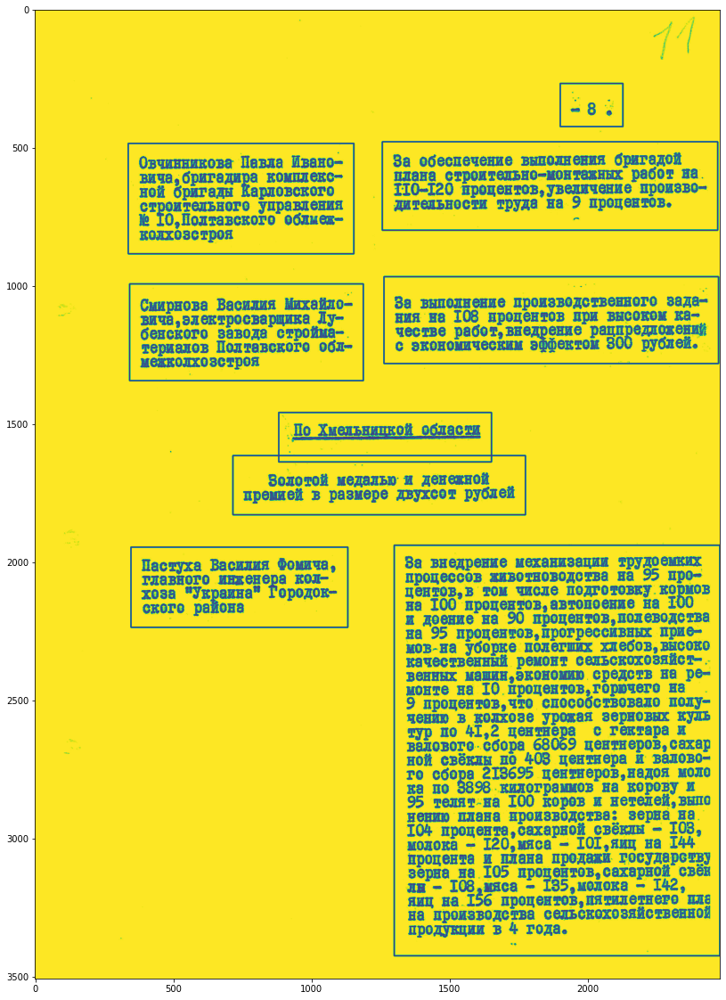

In [6]:
# Find contours, highlight text areas, and extract ROIs
cnts = cv2.findContours(dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
ddd = gray.copy()
ROI_number = 0
list_contur_num = []
list_contur_coord = []
k = -1
for c in cnts:
    area = cv2.contourArea(c)
    k += 1 
    if area > 10000:
        list_contur_num.append(k)
        x,y,w,h = cv2.boundingRect(c)
        list_contur_coord.append([x,y,w,h])
        cv2.rectangle(ddd, (x, y), (x + w, y + h), (36,255,12), 3)
        # ROI = image[y:y+h, x:x+w]
        # cv2.imwrite('ROI_{}.png'.format(ROI_number), ROI)
        # ROI_number += 1
print(list_contur_coord)
print(len(list_contur_coord))
show_image(ddd)

In [7]:
def def_text(out, file_text, file_fragment_text):
    d = pytesseract.image_to_data(out, output_type=pytesseract.Output.DICT, lang="rus")
    n_boxes = len(d['level'])
    print(n_boxes)
    text = ' '.join([kk for kk in d['text'] if len(kk.strip()) > 0])
    text = text.replace('\n',' ').replace('- ','')
    print(text)
    if len(text.strip())>0:
        file_text.write(text.strip() + '\n')
    img_rez = out.copy()
    #file_mistakes = open('file_mistakes2.txt','a')
    for i in range(n_boxes):
        (t, x, y, w, h) = (d['text'][i],d['left'][i], d['top'][i], d['width'][i], d['height'][i])    
        img_rez = cv2.rectangle(img_rez, (x, y), (x + w, y + h), (0, 255, 0), 1)
        t = t.strip().replace('|','').replace('.','').replace('--','').replace('—-','').replace('”','')
        if len(t)>0 and len(t)< 15:# and not t.isdigit():
            print(t, x, y, w, h, sep=' | ')
            file_fragment_text.write('|'.join([t, str(x), str(y), str(w), str(h)]) + '\n')
            #file_mistakes.write(t+'\n'))

In [25]:
def string_recog(in_img):
    ret, threshold_gray2 = cv2.threshold(in_img, 120, 255, 0)
    show_image(threshold_gray2)
    binary2 = cv2.adaptiveThreshold(threshold_gray2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 35, -5)
    # Show pictures 
    show_image(binary2)
    kernel2 = cv2.getStructuringElement(cv2.MORPH_RECT,(9,9))
    dilation2 = cv2.dilate(binary2,kernel2,iterations = 2)
    show_image(dilation2)

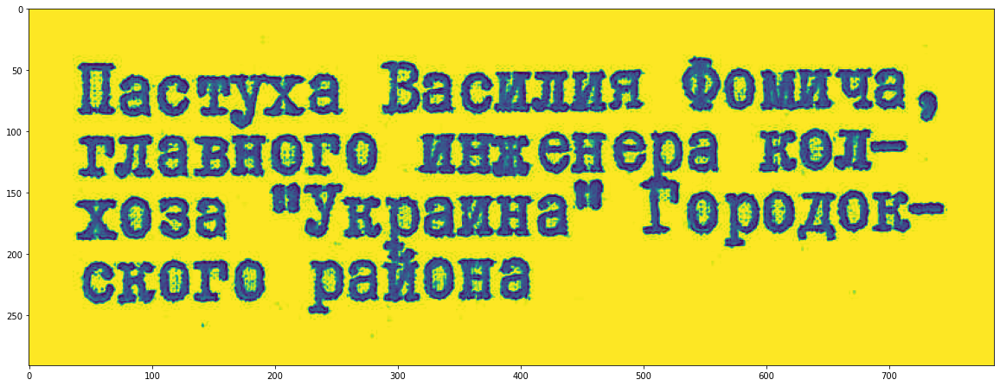

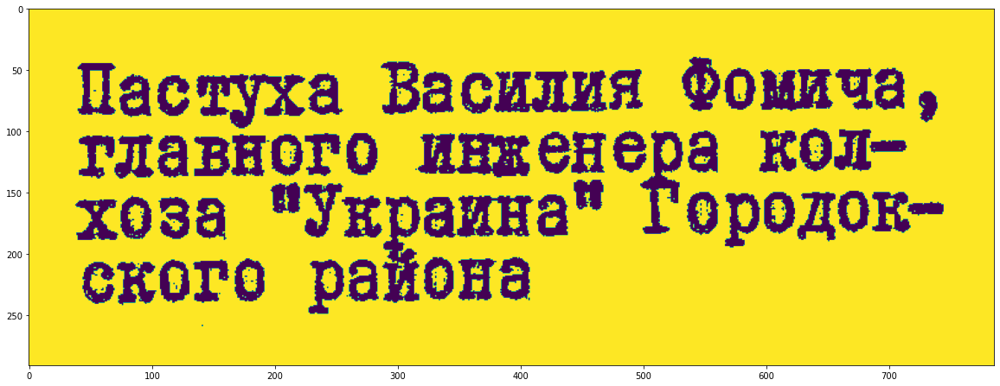

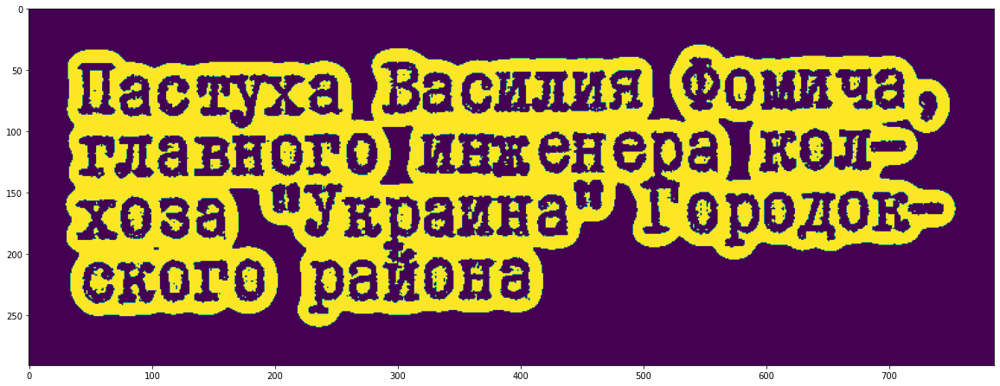

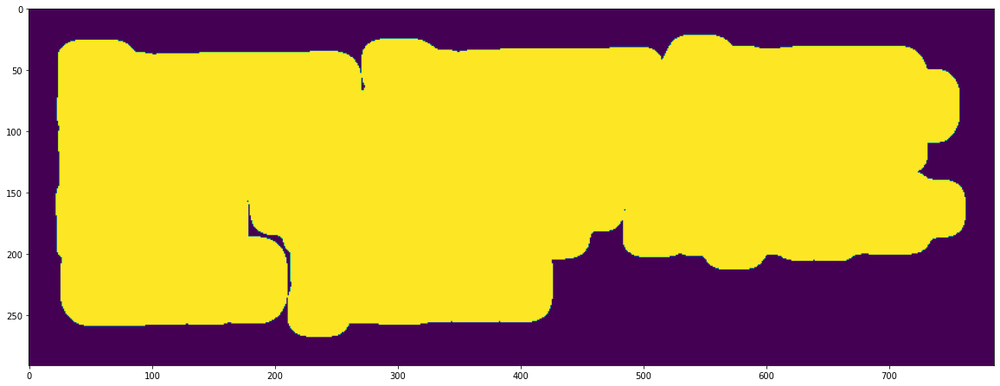

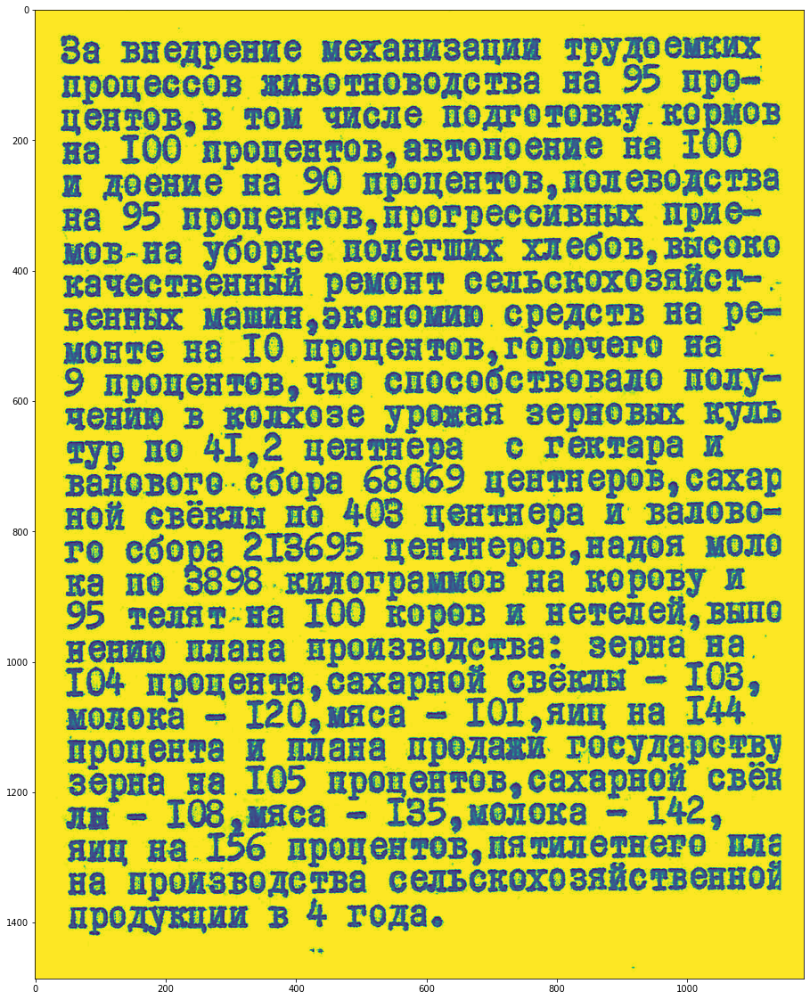

...

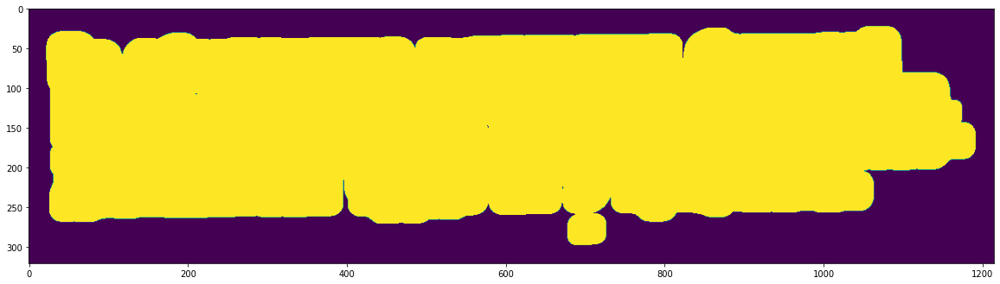

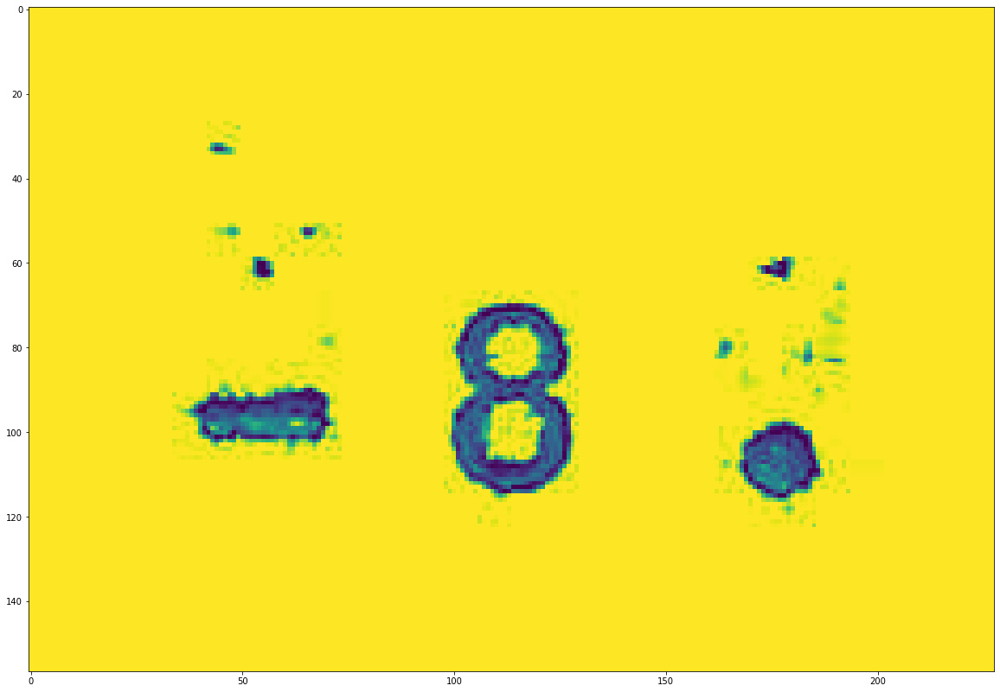

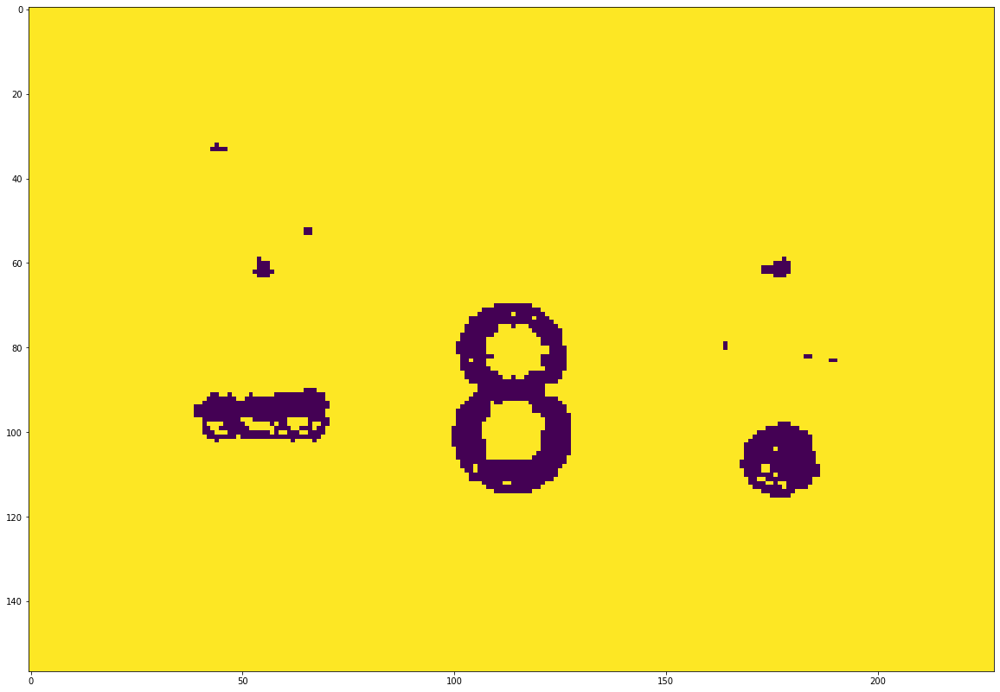

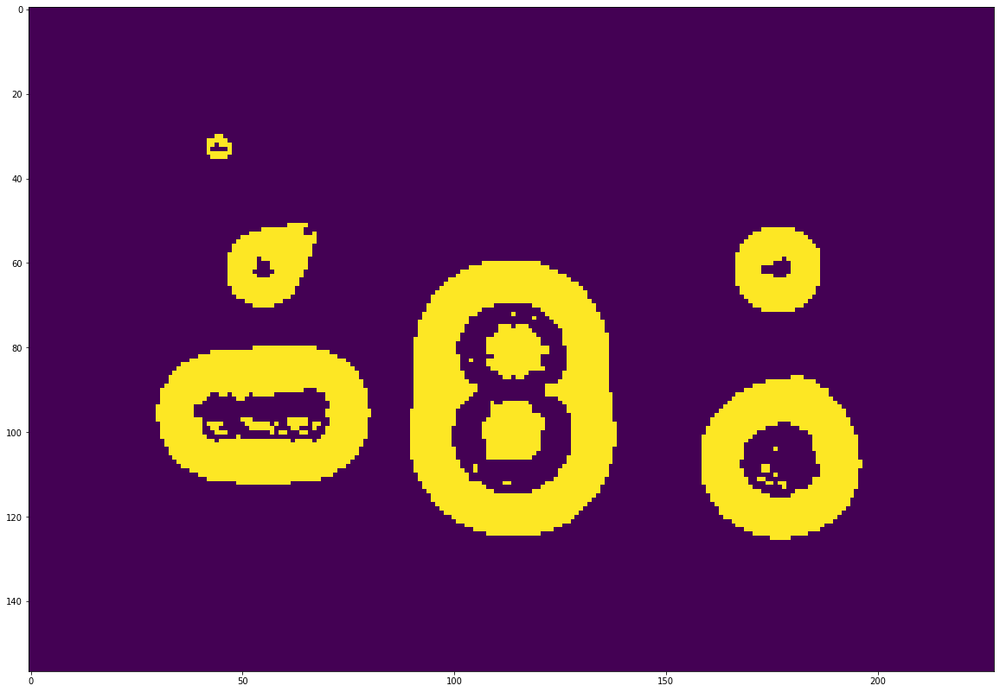

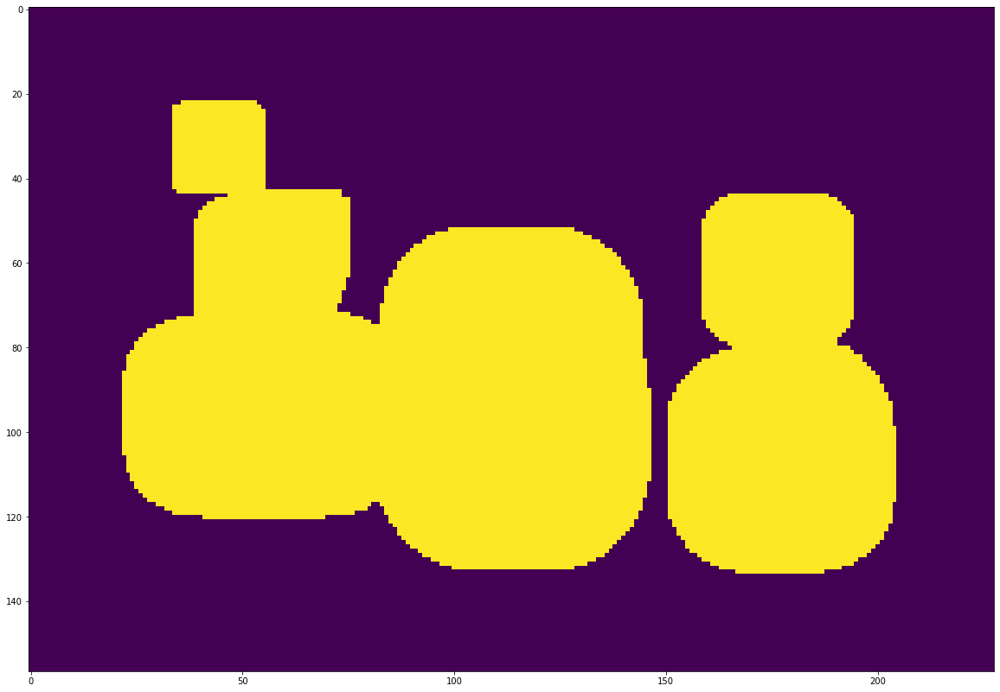

In [26]:
ish_img = cv2.imread(name_jpg, 0)
file_text = open('file_text.txt','a')
file_fragment_text = open('file_fragment_text.txt','a')
for coord in list_contur_coord:
    out = copy.copy(ish_img[coord[1]:coord[1]+coord[3]+1, coord[0]:coord[0]+coord[2]+1])
    show_image(out)
    string_recog(out)
#     out = cv2.fastNlMeansDenoisingColored(out,None,10,7,21,None)
#     show_image(out)
#     out = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)
#     ret, out = cv2.threshold(out, 120, 255, 0)
#     show_image(out)
#     kernel = np.ones((5,5),np.uint8)
#     out = cv2.morphologyEx(out, cv2.MORPH_OPEN, kernel)
#     def_text(out, file_text, file_fragment_text)
# file_fragment_text.write('new_document\n')
# file_text.write('new_document\n')
# file_text.close()
# file_fragment_text.close()